# Comments on this document
This is the main file for the data handling and manipulation. All tasks are carried out in external functions in separate .py files to keep the notebook clean.

In [1]:
# import the required packages. Add more if necessary
import pandas as pd # data processing
import numpy as np # data processing
import matplotlib.pyplot as plt # create plots
import plotly.graph_objects as go # create interactive plots
import os # interaction with operating system

import Data_Import
import Data_Cleaning
import Data_Visualization
import Helper

In [2]:
## You don't need to change this cell. Always reloads modules (external functions) when cell is executed so that the newest version is used
%load_ext autoreload
%autoreload 2

In [3]:
# Adjust this cell with your preferences
# Settings of plots
figSize = [15, 9] # size of figures
fontSize = 17 # Size of numbers and text in plots
lineWidth = 3 # linewidth in plots

# adapts the plot settings for all future plots
plt.rcParams['figure.figsize'] = figSize
plt.rcParams['font.size'] = fontSize
plt.rcParams['lines.linewidth'] = lineWidth

path_to_data_folder = 'Data' # Provide the path to the folder containing the data
latest_data_directory = os.path.join('spring_data', 'wabesense_discharge_2023-09-01')

path_to_plot_folder = 'Plots' # Enter a name for the folder where the plots will be saved
plotFileType = 'pdf' # 'pdf' or 'png'; filetype for the plots

if not os.path.isdir(path_to_plot_folder): # creates the folder if it does not exist yet
    os.makedirs(path_to_plot_folder)

# read and visualize the spring data

In [135]:
# returns multiple lists
spring_names, spring_description, spring_data_paths, spring_data_dfs = Data_Import.import_spring_data(
    os.path.join(path_to_data_folder, latest_data_directory))

In [178]:
# clean the data: keep only valid data range
valid_spring_data_dfs = []
for df in spring_data_dfs:
    df = Data_Cleaning.keep_only_valid_data(df)
    valid_spring_data_dfs.append(df)

In [238]:
# create and save dataframes with different time resolutions for Ulrika and Paliu Fravi
path_to_folder = os.path.join(path_to_data_folder, 'spring_data', 'resampled_data')
resolutions = ['H', 'D', 'W', 'M']  # Hourly, Daily, Weekly, Monthly
paliu_dfs = Data_Cleaning.resample_and_save_dataframes(valid_spring_data_dfs[0], resolutions, path_to_folder, prefix='Paliu_Fravi')
ulrika_dfs = Data_Cleaning.resample_and_save_dataframes(valid_spring_data_dfs[8], resolutions, path_to_folder, prefix='Ulrika')

Directory 'Data/spring_data/resampled_data' created.


In [179]:
ulrika_df = valid_spring_data_dfs[8]
paliufravi_df = valid_spring_data_dfs[0]

In [ ]:
for i in range(0, len(valid_spring_data_dfs)):
    fig_single_spring = Data_Visualization.plot_single_spring(spring_names[i], valid_spring_data_dfs[i], spring_description[i], path_to_plot_folder)

# read and visualize the meteo data

In [232]:
meteo_folders = ['Freienbach', 'Oberriet_Kriessern', 'Oberriet_Moos', 'Reichenau', 'Chur', 'Rothenbrunnen', 'Thusis']
meteo_data_dfs = {}
for folder in meteo_folders:
    folder_path = os.path.join(path_to_data_folder, 'meteo_data', folder)
    data_file = Data_Import.find_file_with_pattern(folder_path)
    data_frames = Data_Import.read_multi_dataset_txt_file(data_file, delimiter=';')
    meteo_data_dfs[folder] = data_frames

In [236]:
# add the timezone to the spring data
for station, df_list in meteo_data_dfs.items():
    Data_Cleaning.add_timezone_to_dataframe(df_list[1], 'UTC')

In [ ]:
# create and save dataframes with different time resolutions for Ulrika and Paliu Fravi
path_to_folder = os.path.join(path_to_data_folder, 'meteo_data', 'resampled_data')
resolutions = ['H', 'D', 'W', 'M']  # Hourly, Daily, Weekly, Monthly
paliu_dfs = Data_Cleaning.resample_and_save_dataframes(valid_spring_data_dfs[0], resolutions, path_to_folder, prefix='Paliu_Fravi')
ulrika_dfs = Data_Cleaning.resample_and_save_dataframes(valid_spring_data_dfs[8], resolutions, path_to_folder, prefix='Ulrika')

In [123]:
for station, df_list in meteo_data_dfs.items():
    Data_Visualization.plot_meteo_precipitation(df_list[1], station, path_to_plot_folder)

/Users/noahnydegger/GitHub/ETH/ETH_MP_Alpine_Water_Springs/Data_Visualization.py:77: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(os.path.join(path_to_plot_folder, 'Meteo_Plots', '{}.pdf'.format(station)))
/Users/noahnydegger/GitHub/ETH/ETH_MP_Alpine_Water_Springs/Data_Visualization.py:77: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(os.path.join(path_to_plot_folder, 'Meteo_Plots', '{}.pdf'.format(station)))


# plot spring and meteo data together

In [208]:
# Ulrika: static plot of spring discharge and precipitation, resolution = 'hourly', 'daily' 'monthly'
Data_Visualization.plot_Ulrika_static(ulrika_df, meteo_data_dfs['Freienbach'][1], path_to_plot_folder, resolution='hourly', start='2022-01-25', end='2022-02-25')

/Users/noahnydegger/GitHub/ETH/ETH_MP_Alpine_Water_Springs/Data_Visualization.py:90: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  spring_df = spring_df[pd.to_datetime(start):pd.to_datetime(end)]


In [267]:
# Ulrika: interactive plot of spring discharge and precipitation, resolution = 'hourly', 'daily' 'monthly'
Data_Visualization.plot_Ulrika_interactive(ulrika_df, meteo_data_dfs['Freienbach'][1], resolution='hourly')

In [214]:
# Ulrika: plot spring discharge and precipitation
# hourly sum
Data_Visualization.plot_hourly_Ulrika(ulrika_df, meteo_data_dfs['Freienbach'][1], path_to_plot_folder)

AttributeError: module 'Data_Visualization' has no attribute 'plot_hourly_Ulrika'

In [126]:
# Ulrika: plot spring discharge and precipitation
# daily sum
Data_Visualization.plot_daily_Ulrika(ulrika_df, meteo_data_dfs['Freienbach'][1], path_to_plot_folder)

In [197]:
# Ulrika: plot spring discharge and precipitation
# monthly sum
Data_Visualization.plot_monthly_Ulrika(ulrika_df, meteo_data_dfs['Freienbach'][1], path_to_plot_folder)

In [188]:
# Ulrika: plot single event form start to end
Data_Visualization.plot_event_Ulrika(ulrika_df, meteo_data_dfs['Freienbach'][1], path_to_plot_folder, start='2022-01-25', end='2022-02-25')

/Users/noahnydegger/GitHub/ETH/ETH_MP_Alpine_Water_Springs/Data_Visualization.py:119: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  spring_df = spring_df[pd.to_datetime(start):pd.to_datetime(end)]


In [185]:
# Ulrika: plot spring discharge and precipitation of multiple stations
# daily sum
Data_Visualization.plot_daily_multiple_Ulrika(ulrika_df, list(meteo_data_dfs.items())[:2], path_to_plot_folder)

In [174]:
# Paliu Fravi: plot spring discharge and precipitation
# hourly sum
Data_Visualization.plot_hourly_Paliu_Fravi(paliufravi_df, list(meteo_data_dfs.items())[3:], path_to_plot_folder)

In [118]:
# Paliu Fravi: plot spring discharge and precipitation
# monthly sum
Data_Visualization.plot_monthly_Paliu_Fravi(paliufravi_df, list(meteo_data_dfs.items())[3:], path_to_plot_folder)

# Correlation of Meteo and Spring data

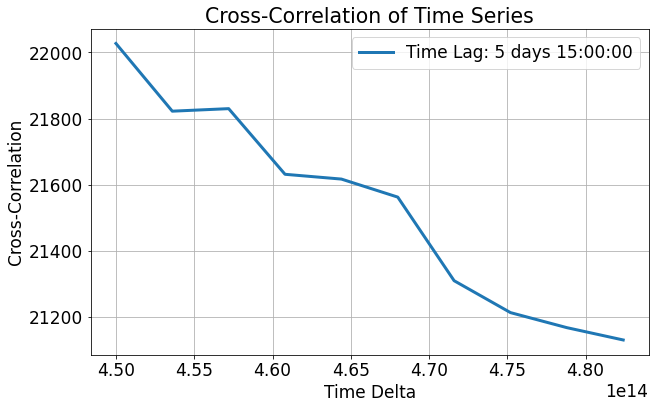

In [266]:
time_lag, cross_corr = Data_Visualization.cross_correlation_time_series(ulrika_dfs['H']['discharge(L/min)'], meteo_data_dfs['Freienbach'][1]['rre150h0'])

In [255]:
print(cross_corr)

[ 2.88418744  9.13581592 14.57526623 ...  0.          0.
  0.        ]


In [260]:
print(time_lag)

5 days 15:00:00


In [243]:
print(ulrika_dfs['H']['discharge(L/min)']
      )

datetime
2021-02-09 23:00:00+00:00    940.450000
2021-02-10 00:00:00+00:00    941.283333
2021-02-10 01:00:00+00:00    988.966667
2021-02-10 02:00:00+00:00    931.783333
2021-02-10 03:00:00+00:00    938.566667
                                ...    
2023-08-28 11:00:00+00:00    398.800000
2023-08-28 12:00:00+00:00    432.116667
2023-08-28 13:00:00+00:00    528.433333
2023-08-28 14:00:00+00:00    752.016667
2023-08-28 15:00:00+00:00    757.950000
Freq: H, Name: discharge(L/min), Length: 22313, dtype: float64
